In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

import torch

import sys
import pathlib
import os
import pathlib
import pickle
import itertools
from typing import Callable

from omegaconf import OmegaConf

import tqdm.notebook as tqdm

### Data generation

In [2]:
path = pathlib.Path(r'C:\Users\Vladimir\PycharmProjects\EEGPatternRecognition\dumps\sym_no_reg\neighbors_init\dump_neighbors_init_seed_269_adj_269.bin')
print(f"{path=}")

with open(path, 'rb') as f:
    target_run_info = pickle.load(f)

path=WindowsPath('C:/Users/Vladimir/PycharmProjects/EEGPatternRecognition/dumps/sym_no_reg/neighbors_init/dump_neighbors_init_seed_269_adj_269.bin')


In [3]:
target_run_info['adj']['init'].shape

(64, 64)

In [4]:
sphere_R = 5.0
n_directions = 8
num_points = 41

In [5]:
np.random.seed(42)

random_directions = np.random.randn(n_directions, *target_run_info['adj']['init'].shape)
random_directions = random_directions / np.linalg.norm(random_directions, ord='fro', axis=(1, 2), keepdims=True)
random_directions = sphere_R * random_directions

In [6]:
def generate_and_store_adj(center, direction, theta, adj_dumps_path: pathlib.Path, theta_idx: int):
    adj = center + direction * theta
    adj = torch.from_numpy(adj).to(dtype=torch.float32)

    with open(adj_dumps_path / f'point_{theta_idx}.bin', 'wb') as f:
        pickle.dump(adj, file=f)


def generate_and_store_cfg(base_cfg_path: str, cfgs_path: pathlib.Path, adj_dumps_path: pathlib.Path, theta: float, theta_idx: int, exp_idx):
    cfg = OmegaConf.load(base_cfg_path)
    cfg['run_name'] = f'view_on_sphere_v2_exp_{exp_idx}_{theta=:.4f}'.replace('.', '')
    cfg['adj_init'] = str(adj_dumps_path / f'point_{theta_idx}.bin')

    with open(cfgs_path / f'point_{theta_idx}.yaml', 'w') as f:
        print(
            OmegaConf.to_yaml(cfg, resolve=True),
            file=f
        )


def prepare_exp_bundle(random_direction: np.ndarray, adj_center: np.ndarray, num_points: int, base_cfg_path: str, exp_idx: int):
    theta_ls = np.linspace(0, 1, num=num_points, endpoint=True)

    base_dir = pathlib.Path(rf'C:\Users\Vladimir\PycharmProjects\EEGPatternRecognition\dumps\view_on_sphere\exp_{exp_idx}')
    base_dir.mkdir()

    adj_dumps_path = base_dir / 'adj_dumps'
    adj_dumps_path.mkdir()

    cfgs_path = base_dir / 'cfgs'
    cfgs_path.mkdir()

    results_path = base_dir / 'results'
    results_path.mkdir()

    for i in range(num_points):
        generate_and_store_adj(
            center=adj_center, 
            direction=random_direction, 
            theta=theta_ls[i], 
            adj_dumps_path=adj_dumps_path, 
            theta_idx=i
        )
        
        generate_and_store_cfg(
            base_cfg_path=base_cfg_path, 
            cfgs_path=cfgs_path, 
            adj_dumps_path=adj_dumps_path, 
            theta=theta_ls[i], 
            theta_idx=i, 
            exp_idx=exp_idx
        )

In [7]:
for i in range(n_directions):
    prepare_exp_bundle(
        random_direction=random_directions[i], 
        adj_center=target_run_info['adj']['init'], 
        num_points=num_points, 
        base_cfg_path=r'C:\Users\Vladimir\PycharmProjects\EEGPatternRecognition\configs\viewer_ft_cfg.yaml', 
        exp_idx=i
    )

### Running

In [8]:
import subprocess
PYTHON_PATH = r'C:\python_venvs\ml_venv\Scripts\python.exe'

def run_point(exp_idx, point_idx):
    args = [
        PYTHON_PATH, 
        r'C:\Users\Vladimir\PycharmProjects\EEGPatternRecognition\src\run_sphere_point.py',
        '--exp_idx',
        str(exp_idx),
        '--point_idx',
        str(point_idx)
    ]

    output = subprocess.run(args, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    return output

In [8]:
output = run_point(0, 0)

In [9]:
print(output.stderr.decode("utf-8"))

  0%|          | 0/85 [00:00<?, ?it/s]C:\Users\Vladimir\PycharmProjects\EEGPatternRecognition\src\utils.py:83: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  train_array.set_montage(self.eloc)
  1%|          | 1/85 [00:00<00:15,  5.52it/s]C:\Users\Vladimir\PycharmProjects\EEGPatternRecognition\src\utils.py:83: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  train_array.set_montage(self.eloc)
C:\Users\Vladimir\PycharmProjects\EEGPatternRecognition\src\utils.py:83: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  train_array.set_montage(self.eloc)
C:\Users\Vladimir\PycharmProjects\EEGPatternRecognition\src\utils.py:83: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  train_array.set_montage(self.eloc)
C:\Users\Vladimir\PycharmProjects\EEGPatternRecognition\src\utils.py:83: RuntimeWarn

In [9]:
import multiprocessing
import multiprocessing.pool

def run_exp(exp_idx):
    points_pool = list(range(num_points))
    pool = multiprocessing.pool.ThreadPool(6)

    outputs = pool.map(lambda point_idx: run_point(exp_idx=exp_idx, point_idx=point_idx), points_pool)
    return outputs

In [9]:
outputs = run_exp(0)

In [ ]:
outputs_ls = []

for exp_idx in range(n_directions):
    outputs = run_exp(exp_idx)
    print(outputs)
    outputs_ls.append(outputs)

[CompletedProcess(args=['C:\\python_venvs\\ml_venv\\Scripts\\python.exe', 'C:\\Users\\Vladimir\\PycharmProjects\\EEGPatternRecognition\\src\\run_sphere_point.py', '--exp_idx', '0', '--point_idx', '0'], returncode=0, stdout=b"Running for: exp_idx='0'\tpoint_idx='0'\r\ntensor([42,  0,  0,  ...,  0,  0,  0], dtype=torch.uint8)\r\ntrain_stats=defaultdict(<function train_model.<locals>.<lambda> at 0x0000016AB357AF20>, {'TP': [7321, 7790, 8318, 8292, 8160, 8039, 8088, 8028, 8053, 8237, 8216, 8113, 8111, 8172, 8194, 8198, 8061, 8229, 8217, 8168, 8270, 8060, 8191, 8141, 8155, 8131, 8027, 8149, 8147, 8125, 8127, 8172, 8205, 8180, 8232, 8314, 8225, 8296, 8232, 8273, 8319, 8291, 8305, 8294, 8370, 8276, 8418, 8369, 8421, 8303, 8442, 8388, 8354, 8335, 8427, 8418, 8455, 8542, 8480, 8525, 8482, 8586, 8644, 8637, 8568, 8535, 8541, 8620, 8547, 8579, 8504, 8514, 8565, 8583, 8598, 8525, 8546, 8513, 8587, 8555, 8579, 8602, 8528, 8651, 8594, 8569, 8606, 8581, 8616, 8582, 8664, 8688, 8671, 8680, 8711, 8639,

### Results

In [7]:
sys.path.append(r'C:\Users\Vladimir\PycharmProjects\EEGPatternRecognition\src')
import models_gnn

In [8]:
exp_idx = 1
base_dir = pathlib.Path(rf'C:\Users\Vladimir\PycharmProjects\EEGPatternRecognition\dumps\view_on_sphere_v4\exp_{exp_idx}')

train_res_ls = []
for point_idx in range(num_points):
    with open(base_dir / 'results' / f'point_{point_idx}.bin', 'rb') as f:
        train_res = pickle.load(file=f)
        train_res_ls.append(train_res)

In [9]:
thetas = np.linspace(0, 1, num_points)
best_step_idxs = []
best_f1 = []
best_acc = []
best_loss = []

for train_res in train_res_ls:
    f1_scores = train_res['logs']['train_curve']['validation']['f1']
    acc_scores = train_res['logs']['train_curve']['validation']['accuracy']
    loss = train_res['logs']['train_curve']['validation']['loss']
    best_idx = np.argmax(f1_scores)

    best_step_idxs.append(best_idx)
    best_f1.append(f1_scores[best_idx])
    best_acc.append(acc_scores[best_idx])
    best_loss.append(loss[best_idx])

best_step_idxs = np.array(best_step_idxs)
best_f1 = np.array(best_f1)
best_acc = np.array(best_acc)

In [26]:
initial_f1 = [
    train_res['logs']['train_curve']['validation']['f1'][0]
    for train_res in train_res_ls
]

initial_acc = [
    train_res['logs']['train_curve']['validation']['accuracy'][0]
    for train_res in train_res_ls
]

initial_loss = [
    train_res['logs']['train_curve']['validation']['loss'][0]
    for train_res in train_res_ls
]

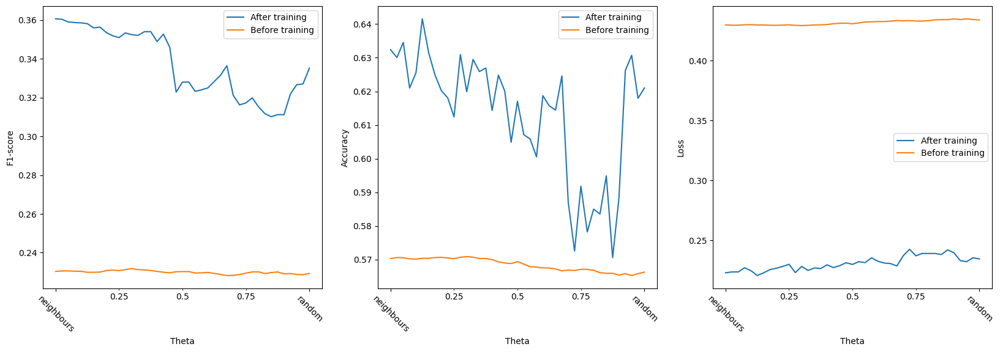

In [29]:
_, ax = plt.subplots(ncols=3, figsize=(20, 6))

ax[0].plot(thetas, best_f1, label='After training')
ax[0].plot(thetas, initial_f1, label='Before training')
ax[0].set_xlabel('Theta')
ax[0].set_ylabel('F1-score')
ax[0].set_xticks(np.linspace(0, 1, num=5), labels=np.linspace(0, 1, num=5), minor=True)
ax[0].set_xticks([0.0, 1.0], labels=['neighbours', 'random'], minor=False, rotation=-45)
ax[0].legend()

ax[1].plot(thetas, best_acc, label='After training')
ax[1].plot(thetas, initial_acc, label='Before training')
ax[1].set_xlabel('Theta')
ax[1].set_ylabel('Accuracy')
ax[1].set_xticks(np.linspace(0, 1, num=5), labels=np.linspace(0, 1, num=5), minor=True)
ax[1].set_xticks([0.0, 1.0], labels=['neighbours', 'random'], minor=False, rotation=-45)
ax[1].legend()

ax[2].plot(thetas, best_loss, label='After training')
ax[2].plot(thetas, initial_loss, label='Before training')
ax[2].set_xlabel('Theta')
ax[2].set_ylabel('Loss')
ax[2].set_xticks(np.linspace(0, 1, num=5), labels=np.linspace(0, 1, num=5), minor=True)
ax[2].set_xticks([0.0, 1.0], labels=['neighbours', 'random'], minor=False, rotation=-45)
ax[2].legend()